Same as 04, just remove the nonlinear activation function.

Layer collapse without nonlinear function.


Layer 1 ($\sigma$ is nonlinear)
$\hat{y} = l_1 = \sigma(x_0^Tw_1)$

Layer 2 $l_2 = \sigma(l_1^T w_2) = \sigma( \sigma(x_0^Tw_1)^T w_2)$

Without activation function:

$l_1 = x_0^T w_1$

$l_2 = l_1^T w_2$

$ = (x_0^T w_1)^T w_2$

$ = x_0^T w_\alpha$

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Text(0, 0.5, 'qwerty dimension 2')

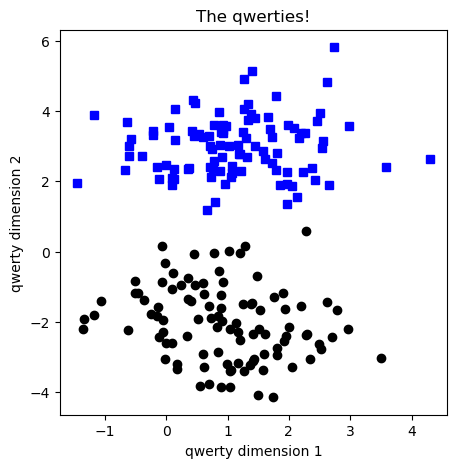

In [1]:
# same as in previous examples
import torch
import torch.nn as nn
import numpy as np

import matplotlib.pyplot as plt

# create data
nPerClust = 100
blur = 1

# centroid is changed comparing to previous example
A = [1,3]
B = [1,-2]

# generate data
a = [ A[0] + np.random.randn(nPerClust)*blur, A[1] + np.random.randn(nPerClust)*blur]
b = [ B[0] + np.random.randn(nPerClust)*blur, B[1] + np.random.randn(nPerClust)*blur]

# true labels
labels_np = np.vstack((np.zeros((nPerClust,1)), np.ones((nPerClust,1))))

# concat into matrix
data_np = np.hstack((a,b)).T

# convert
data = torch.tensor(data_np).float()
labels = torch.tensor(labels_np).float()


# show
fig = plt.figure(figsize=(5,5))
plt.plot(data[np.where(labels==0)[0],0], data[np.where(labels==0)[0],1], 'bs')
plt.plot(data[np.where(labels==1)[0],0], data[np.where(labels==1)[0],1], 'ko')
plt.title('The qwerties!')
plt.xlabel('qwerty dimension 1')
plt.ylabel('qwerty dimension 2')

In [2]:
def createANNModel(learningRate):
    # model architecture
    ANNClassify = nn.Sequential(
        nn.Linear(2,16), # input, 2 features (x,y), output 16
        #nn.ReLU(),      # activation unit
        nn.Linear(16,1), # output unit - one output
        #nn.ReLU(),       # activation
        nn.Linear(1,1), # output
        nn.Sigmoid()    # final activation unit
    )

    # use BCEWithLogitsLoss and remove Sigmoid as final activation unit
    # is the prefered way
    lossfun = nn.BCELoss() # Binary Cross Entropy
 
    # optimizer Stochastic Gradient Descent
    optimizer = torch.optim.SGD(ANNClassify.parameters(), lr=learningRate)

    return ANNClassify, lossfun, optimizer

In [3]:
# train the model
numepochs = 1000

def trainTheModel(ANNModel):
    losses = torch.zeros(numepochs)

    for epochi in range(numepochs):
        yHat = ANNModel(data)
        loss = lossfun(yHat, labels)
        losses[epochi] = loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    
    predictions = ANNModel(data)
    # 0.5 because of sigmoid output
    totalacc = 100*torch.mean(((predictions>0.5) == labels).float())

    return losses, predictions, totalacc

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Text(0, 0.5, 'Loss')

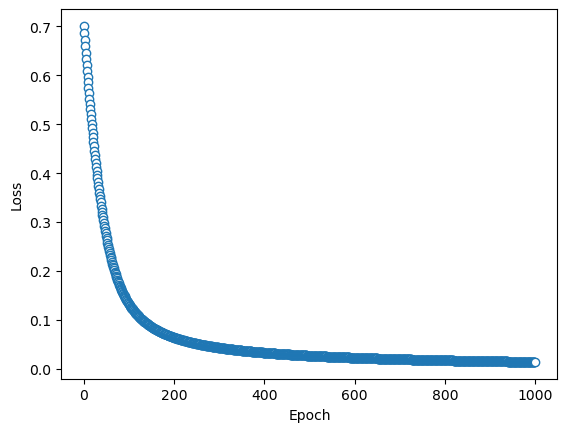

In [4]:
# execute the model
ANNClasify, lossfun, optimizer = createANNModel(0.01)

losses, predictions, totalacc = trainTheModel(ANNClasify)

print('Final accuracy: %g%%' %totalacc)

# show the losses
plt.plot(losses.detach(), 'o', markerfacecolor='w', linewidth=0.1)
plt.xlabel('Epoch')
plt.ylabel('Loss')

In [5]:
# varying learning rates

# Experiment
learningrates = np.linspace(.001, .1, 50)

accByLR = []
allLosses = np.zeros((len(learningrates), numepochs))

for i,lr in enumerate(learningrates):
    ANNClasify, lossfun, optimizer = createANNModel(lr)
    losses, predictions, totalacc = trainTheModel(ANNClasify)

    accByLR.append(totalacc)
    allLosses[i,:] = losses.detach()

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Text(0, 0.5, 'Loss')

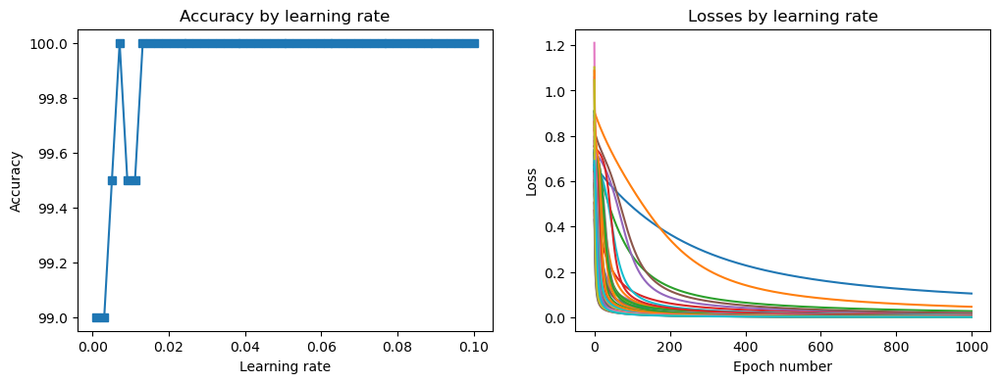

In [6]:
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].plot(learningrates, accByLR, 's-')
ax[0].set_xlabel('Learning rate')
ax[0].set_ylabel('Accuracy')
ax[0].set_title('Accuracy by learning rate')

ax[1].plot(allLosses.T)
ax[1].set_title('Losses by learning rate')
ax[1].set_xlabel('Epoch number')
ax[1].set_ylabel('Loss')